In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/content/sample_data/cvimages'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

import dohelp as dh

/content/sample_data/cvimages/03.png
/content/sample_data/cvimages/07.jpg
/content/sample_data/cvimages/05.jpg
/content/sample_data/cvimages/01.jpg
/content/sample_data/cvimages/06.jpeg
/content/sample_data/cvimages/05.jpeg
/content/sample_data/cvimages/02.jpg
/content/sample_data/cvimages/04.jpg
/content/sample_data/cvimages/08.jpg


In [ ]:

import cv2
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise
from skimage import util,filters,feature
from scipy import ndimage
from scipy import signal
import scipy.ndimage.filters
from skimage import color


In [ ]:
img_01 = cv2.imread("/content/sample_data/cvimages/01.jpg",0)
img_02 = cv2.imread("/content/sample_data/cvimages/02.jpg",0)
img_03 = cv2.imread("/content/sample_data/cvimages/03.png",0)
img_04 = cv2.imread("/content/sample_data/cvimages/04.jpg",0)
img_05 = cv2.imread("/content/sample_data/cvimages/05.jpg",0)
img_06 = cv2.imread("/content/sample_data/cvimages/06.jpeg",0)
img_07 = cv2.imread("/content/sample_data/cvimages/07.jpg",0)
img_08 = cv2.imread("/content/sample_data/cvimages/08.jpg",0)



Load the set of images and display them as Grayscale and rgb images. You are required to show these
images ”inline” rather than creating a new window for every other image

In [ ]:
def displayImage(image,title):
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

Implement the function rgbExclusion() in the helper script, in which the input image is decomposed
into the three channels: R, G and B and return the image excluding the specified channel. Display
the results in notebook.

In [ ]:
# 0-b, 1-g, 2-r
def rgbExclusionRedChannel(image1):
    bgr_image = image1.copy()
    bgr_image[:,:,0] = 0 #empty blue channel
    bgr_image[:,:,1] = 0 #empty green channel
    # and we are left out with red channel
    displayImage(bgr_image,"Red Channel")

In [ ]:
# 0-b, 1-g, 2-r
def rgbExclusionGreenChannel(image1):
    bgr_image = image1.copy()
    bgr_image[:,:,0] = 0 #empty blue channel
    bgr_image[:,:,2] = 0 #empty red channel
    # and we are left out with red channel
    displayImage(bgr_image,"Green Channel")

In [ ]:
# 0-b, 1-g, 2-r
def rgbExclusionBlueChannel(image1):
    bgr_image = image1.copy()
    bgr_image[:,:,2] = 0 #empty red channel
    bgr_image[:,:,1] = 0 #empty green channel
    # and we are left out with red channel
    displayImage(bgr_image,"Blue Channel")

Histogram code

In [ ]:
def makehisto(image1):
    # find frequency of pixels in range 0-255 
    histr = cv2.calcHist([image1],[0],None,[256],[0,256]) 
    # show the plotting graph of an image 
    plt.plot(histr) 
    plt.title('Histogram')
    plt.show() 


histogram equalization

In [ ]:
def equalizedHistogram(image1):
    from skimage import exposure
    plt.title("Equalized image")
    # Adjust the contrast of the filtered image by applying Histogram Equalization 
    image_equalized = exposure.equalize_hist(image1)
    plt.imshow(image_equalized)
    #displayImage(image_equalized,"Actual image")
    #return image_equalized
    #makehisto(image_equalized)


You are required to implement the convolution operation from scratch. 

In [ ]:
def myConvolve2d(image, kernel):
    """
    In this function convolution operation is implemented from scratch
    # This function which takes an image and a kernel 
    # and returns the convolution of them
    # Args:
    #   image: a numpy array of size [image_height, image_width].
    #   kernel: a numpy array of size [kernel_height, kernel_width].
    # Returns:
    #   a numpy array of size [image_height, image_width] (convolution output).
    
    """
    kernel = np.flipud(np.fliplr(kernel))    # Flip the kernel
    output = np.zeros_like(image)            # convolution output
    # Add zero padding to the input image
    image_padded = np.zeros((image.shape[0] + 2, image.shape[1] + 2))   
    image_padded[1:-1, 1:-1] = image
    
    # Loop over every pixel of the image and implement convolution operation (element wise multiplication and summation). 
    # You can use two loops. The result is stored in the variable output.
    
    for x in range(image.shape[0]):     # Loop over every pixel of the image
        for y in range(image.shape[1]):
            # element-wise multiplication and summation 
            output[x,y]=(kernel*image_padded[x:x+3,y:y+3]).sum()
        
    
    return output

Reading & displaying images in **Grayscale**

In [ ]:
for dirname, _, filenames in os.walk('/content/sample_data/cvimages'):
    for filename in filenames:
        im=(os.path.join(dirname, filename))
        img_gray = cv2.imread(im,0) # 0 for grayscale
        dh.displayImage(img_gray,"Gray")
        

Reading & displaying images in **RGB**

In [ ]:
for dirname, _, filenames in os.walk('/content/sample_data/cvimages'):
    for filename in filenames:
        im=(os.path.join(dirname, filename))
        img_colored = cv2.imread(im,1) # 1 for RGB
        dh.displayImage(img_colored,"Colored Image")
        


Derivatives functions

In [ ]:
def first_dev_gaussian_x(x, y, sigma):
    temp = (x ** 2 + y ** 2) / (2 * sigma ** 2)
    return -x * np.exp(-temp)/ (2* np.pi * sigma ** 4) 
 
def first_dev_gaussian_y(x, y, sigma):

    temp = (x ** 2 + y ** 2) / (2 * sigma ** 2)
    return -y * np.exp(-temp)/ (2* np.pi * sigma ** 4)
 
def second_dev_gaussian_x(x, y, sigma):

    temp = (x ** 2 + y ** 2) / (2 * sigma ** 2)
    temp1 = np.exp(-temp) /(2* np.pi * sigma ** 4) 
    return (-1 + x**2 / sigma**2)* temp1
 
def second_dev_gaussian_y(x, y, sigma):

    temp = (x ** 2 + y ** 2) / (2 * sigma ** 2)
    temp1 = np.exp(-temp) /(2* np.pi * sigma ** 4) 
    return (-1 + y**2 / sigma**2)* temp1

def second_dev_gaussian(x, y, sigma):
    temp = (x ** 2 + y ** 2) / (2 * sigma ** 2)
    temp1 = np.exp(-temp) /(2* np.pi * sigma ** 4) 
    return (x * y / 2 * np.pi *sigma**6)* temp1

def gaussian(x, y, sigma):
    temp = (x ** 2 + y ** 2) / (2 * sigma ** 2)
    return (-1 * np.exp(-temp)/ (2* np.pi * sigma ** 2) )




Implement the function rgbExclusion() in the helper script, in which the input image is decomposed
into the three channels: R, G and B and return the image excluding the Red channel.

In [ ]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        im=(os.path.join(dirname, filename))
        img_colored = cv2.imread(im) # default value
        red_image=dh.rgbExclusionRedChannel(img_colored)


Implement the function rgbExclusion() in the helper script, in which the input image is decomposed
into the three channels: R, G and B and return the image excluding the Green channel.

In [ ]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        im=(os.path.join(dirname, filename))
        img_colored = cv2.imread(im) # default value
        green_image=dh.rgbExclusionGreenChannel(img_colored)


Implement the function rgbExclusion() in the helper script, in which the input image is decomposed
into the three channels: R, G and B and return the image excluding the Blue channel.

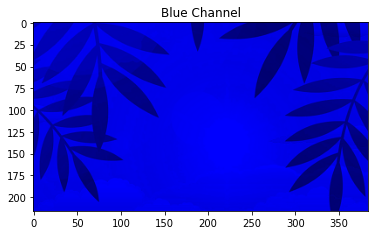

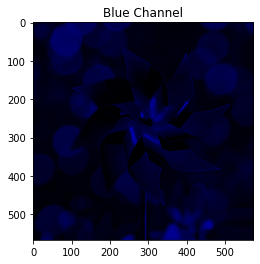

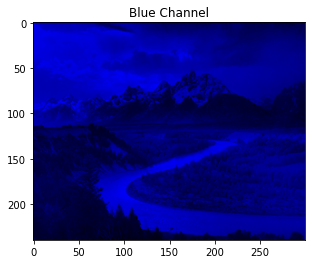

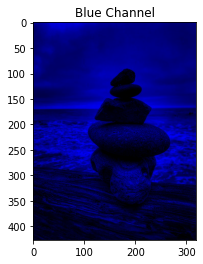

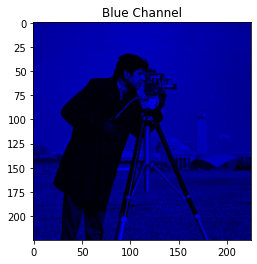

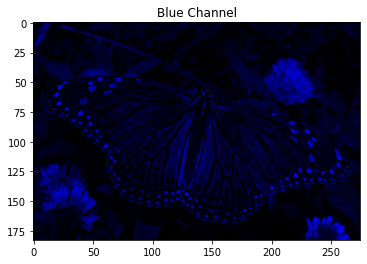

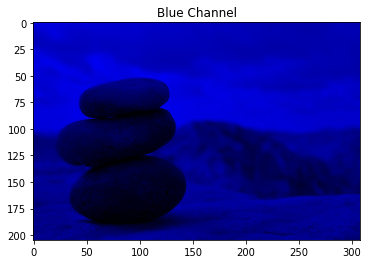

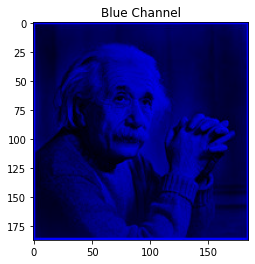

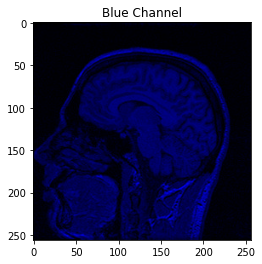

In [ ]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        im=(os.path.join(dirname, filename))
        img_colored = cv2.imread(im) # default value
        blue_image=dh.rgbExclusionBlueChannel(img_colored)


Take at-least 3 images from given set and plot histograms before and after applying histogram equalization. 
Show these image inline format i.e. 
grayscale image –> display histogram –> apply histogram
equalization–> display the equalized image and its histogram.

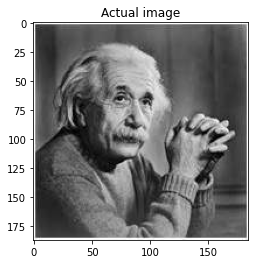

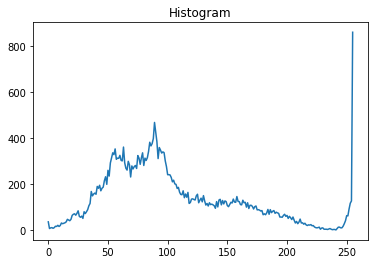

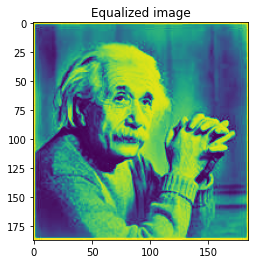

In [ ]:
dh.displayImage(img_04,"Actual image")
dh.makehisto(img_04)
equalizedHistogram(img_04)
#makehisto(equalizedHistogram(img_04))

Implementing the builtin convolution function

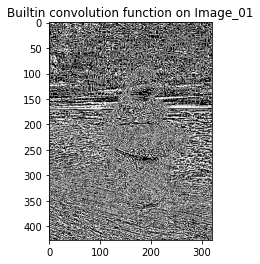

In [ ]:
kernel = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
f1 = signal.convolve2d(img_01,kernel, 'same')
f2 = signal.convolve2d(img_04,kernel, 'same')
f3 = signal.convolve2d(img_07,kernel, 'same')

f1= scipy.ndimage.filters.laplace(img_01, output=None, mode='reflect', cval=0.0)
plt.title("Builtin convolution function on Image_01")
plt.imshow(f1,cmap=plt.cm.gray)


#plt.rcParams['figure.figsize'] = (10.0, 8.0)
#fig = plt.figure()
#fig.add_subplot(1, 5, 1)
#plt.imshow(f1)
#plt.title("Builtin convolution function on Image_01")
#fig.add_subplot(1, 5, 2)
#plt.imshow(f2)
#plt.title("Builtin convolution function on Image_04")
#fig.add_subplot(1, 5, 3).imshow(f3)
#plt.title("Builtin convolution function on Image_07")



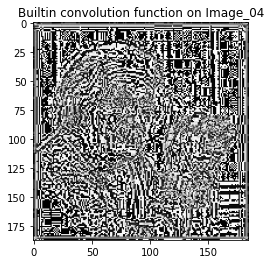

In [ ]:
f2= scipy.ndimage.filters.laplace(img_04, output=None, mode='reflect', cval=0.0)
plt.title("Builtin convolution function on Image_04")
plt.imshow(f2,cmap=plt.cm.gray)



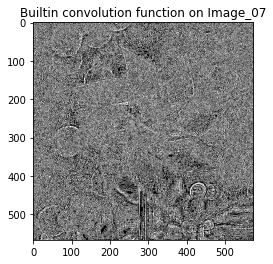

In [ ]:
f3= scipy.ndimage.filters.laplace(img_07, output=None, mode='reflect', cval=0.0)
plt.title("Builtin convolution function on Image_07")
plt.imshow(f3,cmap=plt.cm.gray)


You are required to implement the convolution operation from scratch. This function which takes an
image and a kernel and returns the convolution of them.


Compare the results of your implemented function with the ones available (built-in) in python
packages. You are required to convolve images for sharpening and blurring effects.

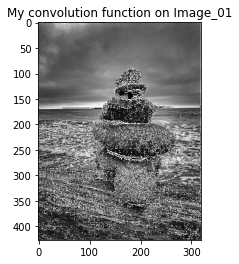

In [ ]:
# Convolve the sharpen kernel (laplacian) and the image
kernel = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
#Call the function my_convolve2d
image_sharpen = dh.myConvolve2d(img_01,kernel)
plt.title("My convolution function on Image_01")
plt.imshow(image_sharpen,cmap=plt.cm.gray)

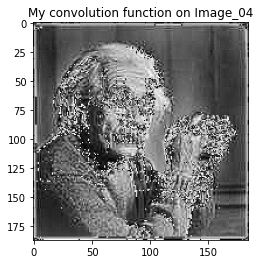

In [ ]:
# Convolve the sharpen kernel (laplacian) and the image
kernel = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
#Call the function my_convolve2d
image_sharpen = dh.myConvolve2d(img_04,kernel)
plt.title("My convolution function on Image_04")
plt.imshow(image_sharpen,cmap=plt.cm.gray)

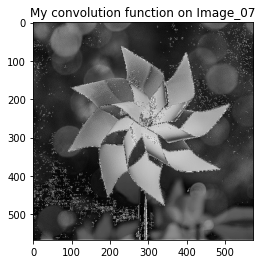

In [ ]:
# Convolve the sharpen kernel (laplacian) and the image
kernel = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
#Call the function my_convolve2d
image_sharpen = dh.myConvolve2d(img_07,kernel)
plt.title("My convolution function on Image_07")
plt.imshow(image_sharpen,cmap=plt.cm.gray)

2.5
Load a couple of images from the given set.
1 Apply box filter using convolution, and display the resultant image

Text(0.5, 1.0, 'Filtered image_01')

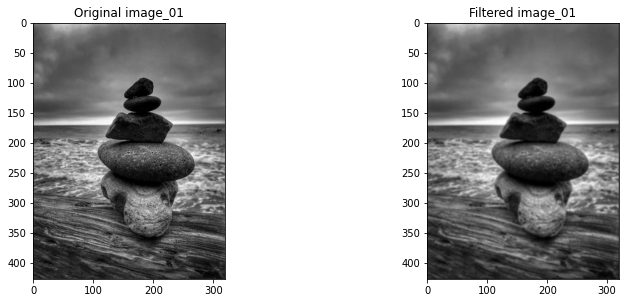

In [ ]:
#img_01, img_04
#img = cv2.imread("./Images/image1.jpg",0)

kernel = np.ones((3,3),np.float32)/9 #blur
f = signal.convolve2d(img_01,kernel, 'same')

plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(3, 3, 1)
plt.imshow(img_01,cmap=plt.cm.gray)
plt.title("Original image_01")
fig.add_subplot(3, 3, 2)
plt.imshow(f,cmap=plt.cm.gray)
plt.title("Filtered image_01")

Text(0.5, 1.0, 'Filtered image_04')

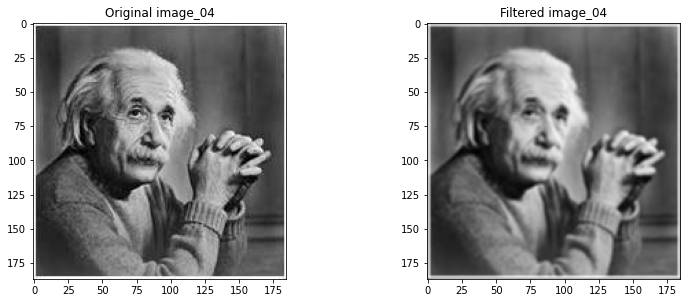

In [ ]:
kernel = np.ones((3,3),np.float32)/9 #blur
f = signal.convolve2d(img_04,kernel, 'same')

plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(3, 3, 1)
plt.imshow(img_04,cmap=plt.cm.gray)
plt.title("Original image_04")
fig.add_subplot(3, 3, 2)
plt.imshow(f,cmap=plt.cm.gray)
plt.title("Filtered image_04")

Apply Gaussian filter to the image, with varying sigma values

Text(0.5, 1.0, 'Gaussian Filter image_02, sigma=3')

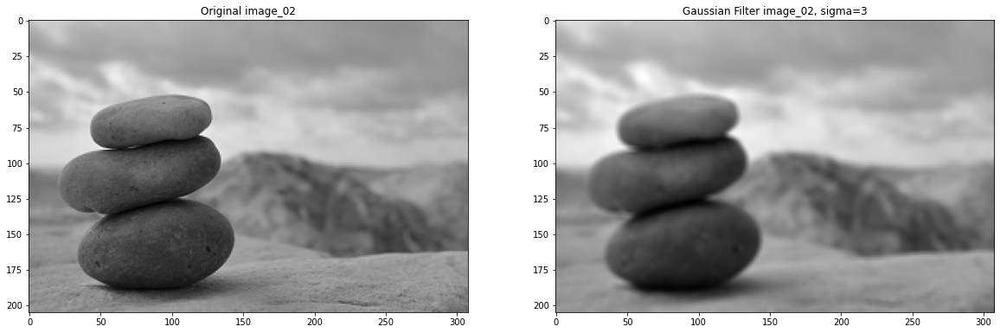

In [ ]:
img_gaussianFilter = cv2.GaussianBlur(img_02, (5,5),sigmaX=3)
fig = plt.figure()
fig.add_subplot(1, 2, 1)
plt.imshow(img_02,cmap=plt.cm.gray)
plt.title("Original image_02")
fig.add_subplot(1, 2, 2)
plt.imshow(img_gaussianFilter,cmap=plt.cm.gray)
plt.title("Gaussian Filter image_02, sigma=3")

Text(0.5, 1.0, 'Gaussian Filter image_05, sigma=5')

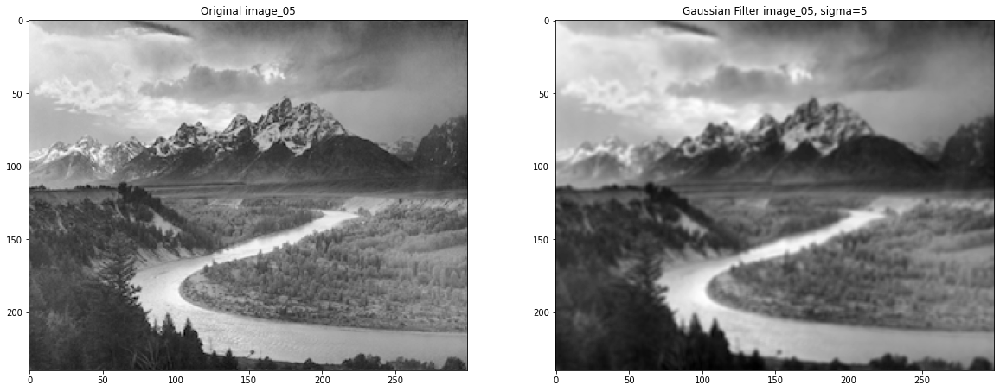

In [ ]:
img_gaussianFilter = cv2.GaussianBlur(img_05, (3,3),sigmaX=5)
fig = plt.figure()
fig.add_subplot(1, 2, 1)
plt.imshow(img_05,cmap=plt.cm.gray)
plt.title("Original image_05")
fig.add_subplot(1, 2, 2)
plt.imshow(img_gaussianFilter,cmap=plt.cm.gray)
plt.title("Gaussian Filter image_05, sigma=5")

Add Gaussian Noise and Salt and Pepper Noise to them.
Here Salt and pepper noise is applied on actual image.

Text(0.5, 1.0, 'Salt & pepper noise on image_04')

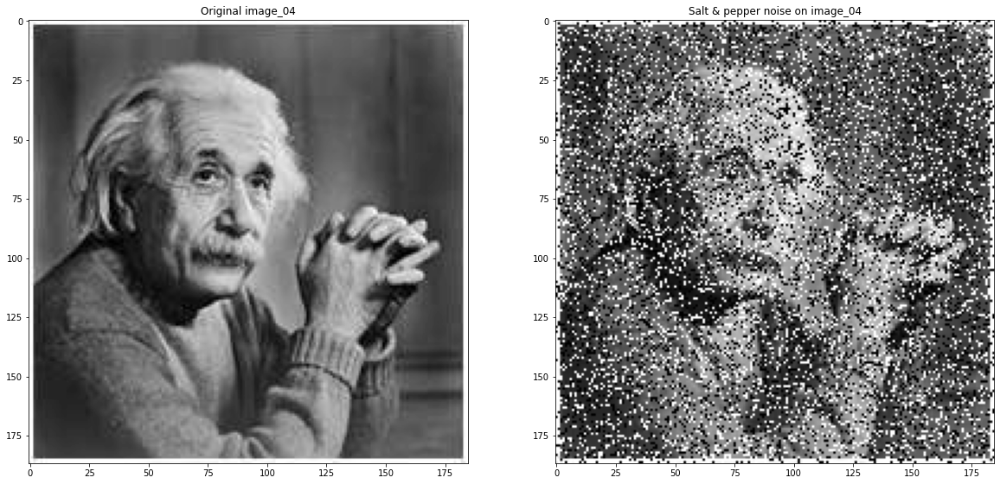

In [ ]:
# Add salt-and-pepper noise to the image.
sp_noise_img4 = random_noise(img_04, mode='s&p',amount=0.3)
 
# The above function returns a floating-point image
# on the range [0, 1], thus we changed it to 'uint8'
# and from [0,255]
sp_noise_img4 = np.array(255*sp_noise_img4, dtype = 'uint8')
 
# Display the noise image
#displayImage(noise_img,"Salt & pepper noise on image_01")

fig = plt.figure()
fig.add_subplot(1, 2, 1)
plt.imshow(img_04,cmap=plt.cm.gray)
plt.title("Original image_04")
fig.add_subplot(1, 2, 2)
plt.imshow(sp_noise_img4,cmap=plt.cm.gray)
plt.title("Salt & pepper noise on image_04")

Text(0.5, 1.0, 'Salt & pepper noise on image_03')

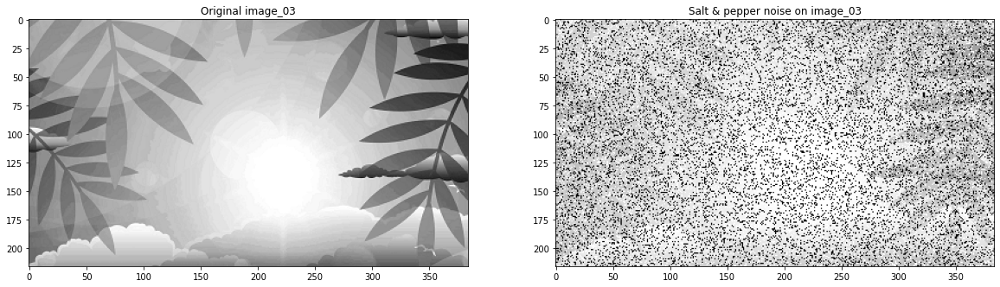

In [ ]:
# Add salt-and-pepper noise to the image.
sp_noise_img3 = random_noise(img_03, mode='s&p',amount=0.3)
 
# The above function returns a floating-point image
# on the range [0, 1], thus we changed it to 'uint8'
# and from [0,255]
sp_noise_img3 = np.array(255*sp_noise_img3, dtype = 'uint8')
 
# Display the noise image
#displayImage(noise_img,"Salt & pepper noise on image_01")

fig = plt.figure()
fig.add_subplot(1, 2, 1)
plt.imshow(img_03,cmap=plt.cm.gray)
plt.title("Original image_03")
fig.add_subplot(1, 2, 2)
plt.imshow(sp_noise_img3,cmap=plt.cm.gray)
plt.title("Salt & pepper noise on image_03")

Here Gaussian noise is applied on actual image.

Text(0.5, 1.0, 'Gaussian noise on image_06')

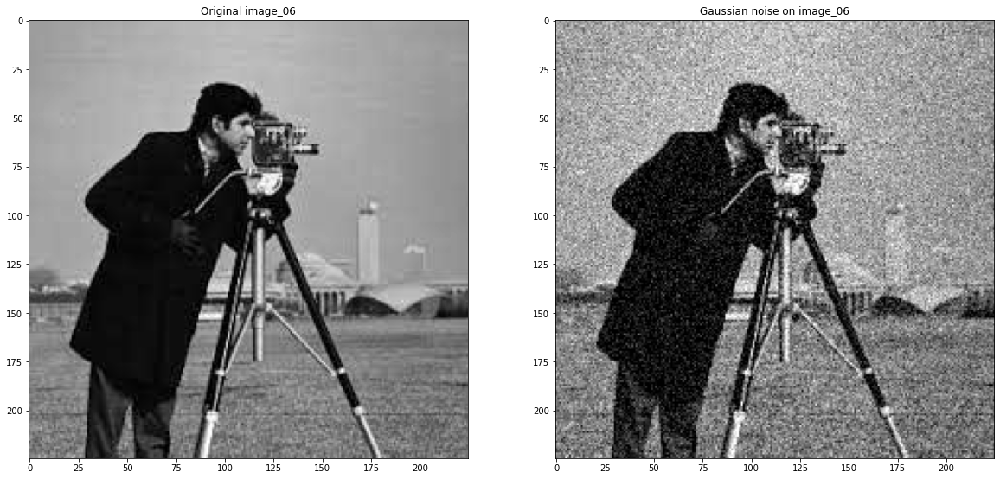

In [ ]:
# Add salt-and-pepper noise to the image.
g_noise_img6 = random_noise(img_06, mode='gaussian', seed=None, clip=True)
 
# The above function returns a floating-point image
# on the range [0, 1], thus we changed it to 'uint8'
# and from [0,255]
g_noise_img6 = np.array(255*g_noise_img6, dtype = 'uint8')
 
# Display the noise image
#displayImage(noise_img,"Blur")

fig = plt.figure()
fig.add_subplot(1, 2, 1)
plt.imshow(img_06,cmap=plt.cm.gray)
plt.title("Original image_06")
fig.add_subplot(1, 2, 2)
plt.imshow(g_noise_img6,cmap=plt.cm.gray)
plt.title("Gaussian noise on image_06")

Text(0.5, 1.0, 'Gaussian noise on image_07')

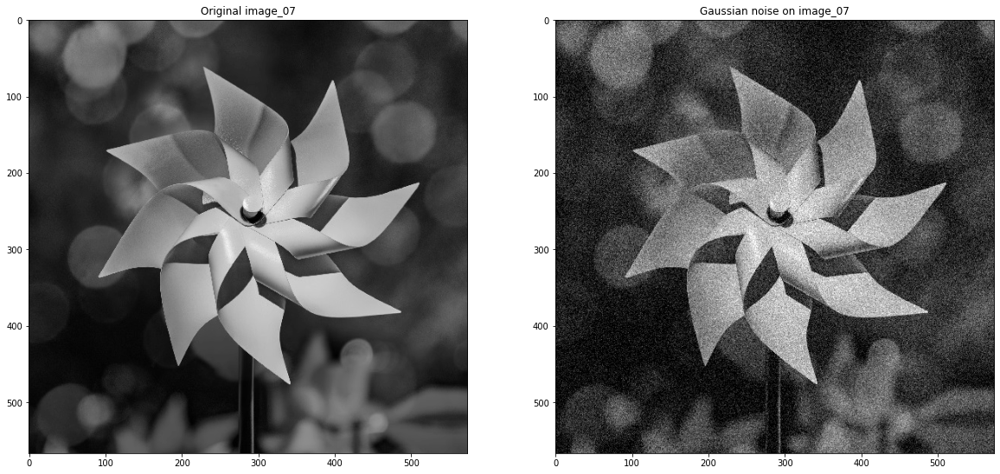

In [ ]:
g_noise_img7 = random_noise(img_07, mode='gaussian', seed=None, clip=True)
 
# The above function returns a floating-point image
# on the range [0, 1], thus we changed it to 'uint8'
# and from [0,255]
g_noise_img7 = np.array(255*g_noise_img7, dtype = 'uint8')
 
# Display the noise image
#displayImage(noise_img,"Blur")

fig = plt.figure()
fig.add_subplot(1, 2, 1)
plt.imshow(img_07,cmap=plt.cm.gray)
plt.title("Original image_07")
fig.add_subplot(1, 2, 2)
plt.imshow(g_noise_img7,cmap=plt.cm.gray)
plt.title("Gaussian noise on image_07")

Apply Gaussian Filter and Median Filters.

Here Gaussian filter is applied on Gaussian noisy


Text(0.5, 1.0, 'Filtered: Gaussian Filter on Gaussian noisy image_07, sigma=3')

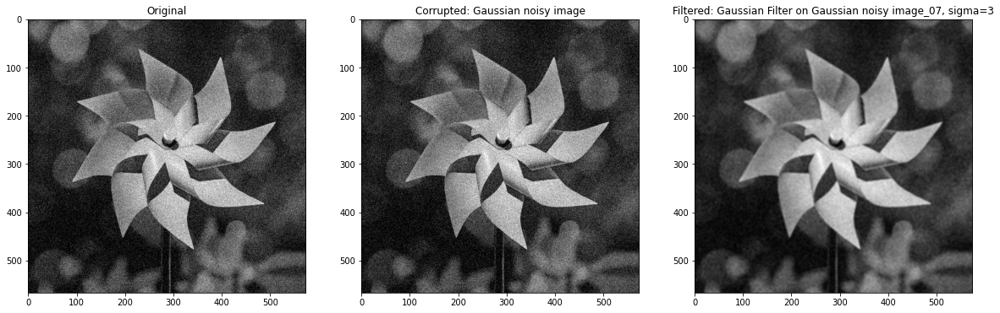

In [ ]:
img_gaussianFilter7 = cv2.GaussianBlur(g_noise_img7, (5,5),sigmaX=3)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(g_noise_img7,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(g_noise_img7,cmap=plt.cm.gray)
plt.title("Corrupted: Gaussian noisy image")
fig.add_subplot(1, 3, 3)
plt.imshow(img_gaussianFilter7,cmap=plt.cm.gray)
plt.title("Filtered: Gaussian Filter on Gaussian noisy image_07, sigma=3")


Text(0.5, 1.0, 'Filtered: Gaussian Filter on Gaussian noisy image_06, sigma=3')

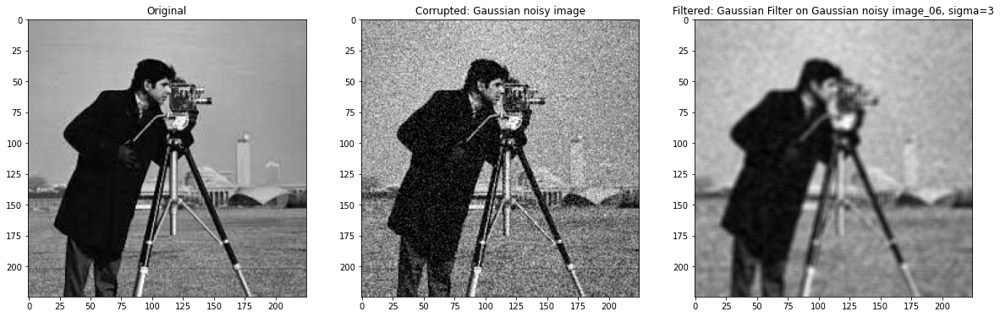

In [ ]:
img_gaussianFilter6 = cv2.GaussianBlur(g_noise_img6, (5,5),sigmaX=3)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_06,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(g_noise_img6,cmap=plt.cm.gray)
plt.title("Corrupted: Gaussian noisy image")
fig.add_subplot(1, 3, 3)
plt.imshow(img_gaussianFilter6,cmap=plt.cm.gray)
plt.title("Filtered: Gaussian Filter on Gaussian noisy image_06, sigma=3")



Here Gaussian filter is applied on salt & pepper noisy

Text(0.5, 1.0, 'Filtered: Gaussian Filter on salt & pepper noisy image_04, sigma=3')

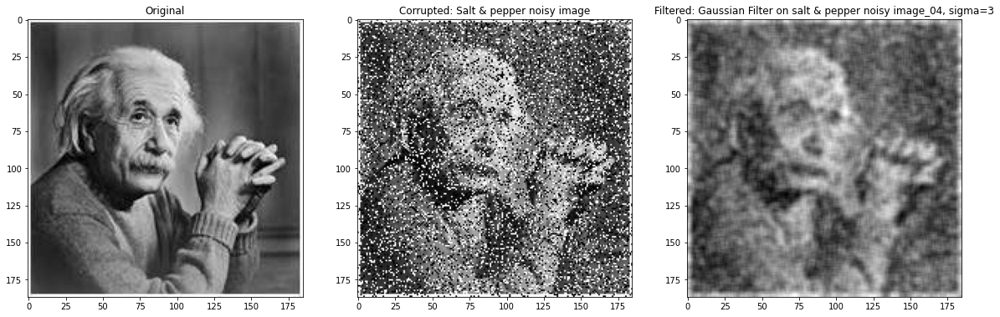

In [ ]:

img_gaussianFilter4 = cv2.GaussianBlur(sp_noise_img4, (5,5),sigmaX=3)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_04,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(sp_noise_img4,cmap=plt.cm.gray)
plt.title("Corrupted: Salt & pepper noisy image")
fig.add_subplot(1, 3, 3)
plt.imshow(img_gaussianFilter4,cmap=plt.cm.gray)
plt.title("Filtered: Gaussian Filter on salt & pepper noisy image_04, sigma=3")


Text(0.5, 1.0, 'Filtered: Gaussian Filter on salt & pepper noisy image_03, sigma=3')

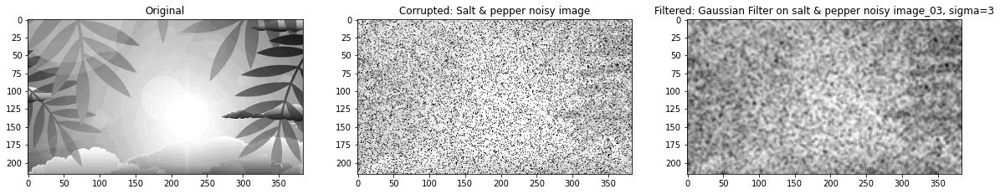

In [ ]:

img_gaussianFilter3 = cv2.GaussianBlur(sp_noise_img3, (5,5),sigmaX=3)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_03,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(sp_noise_img3,cmap=plt.cm.gray)
plt.title("Corrupted: Salt & pepper noisy image")
fig.add_subplot(1, 3, 3)
plt.imshow(img_gaussianFilter3,cmap=plt.cm.gray)
plt.title("Filtered: Gaussian Filter on salt & pepper noisy image_03, sigma=3")



Here median filter is applied on Gaussian noisy

Text(0.5, 1.0, 'Filtered: Median Filter on Gaussian noisy image6')

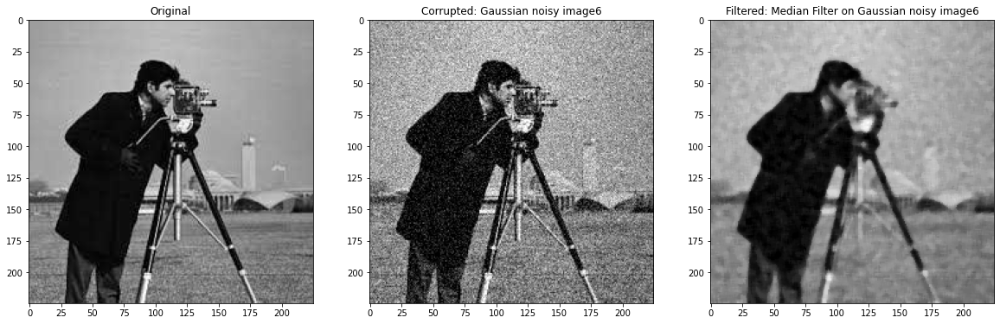

In [ ]:
#Median filter
img_medFilter6 = cv2.medianBlur(g_noise_img6,5)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_06,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(g_noise_img6, cmap=plt.cm.gray)
plt.title("Corrupted: Gaussian noisy image6")
fig.add_subplot(1, 3, 3)
plt.imshow(img_medFilter6,cmap=plt.cm.gray)
plt.title("Filtered: Median Filter on Gaussian noisy image6")


Text(0.5, 1.0, 'Filtered: Median Filter on Gaussian noisy image7')

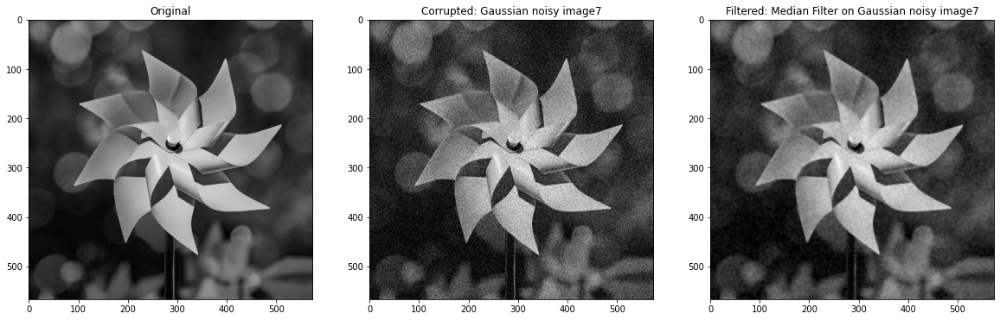

In [ ]:
#Median filter
img_medFilter7 = cv2.medianBlur(g_noise_img7,5)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_07,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(g_noise_img7,cmap=plt.cm.gray)
plt.title("Corrupted: Gaussian noisy image7")
fig.add_subplot(1, 3, 3)
plt.imshow(img_medFilter7,cmap=plt.cm.gray)
plt.title("Filtered: Median Filter on Gaussian noisy image7")



Here median filter is applied on salt & pepper noisy

Text(0.5, 1.0, 'Filtered: Median Filter on Gaussian noisy image4')

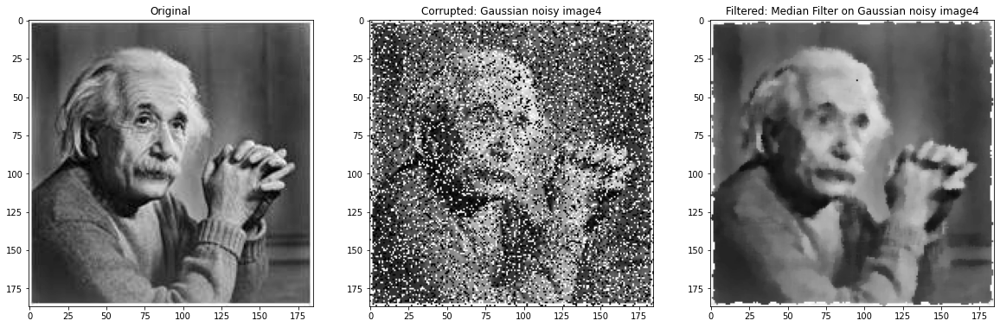

In [ ]:
#Median filter
img_medFilter4 = cv2.medianBlur(sp_noise_img4,5)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_04,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(sp_noise_img4,cmap=plt.cm.gray)
plt.title("Corrupted: Gaussian noisy image4")
fig.add_subplot(1, 3, 3)
plt.imshow(img_medFilter4,cmap=plt.cm.gray)
plt.title("Filtered: Median Filter on Gaussian noisy image4")


Text(0.5, 1.0, 'Filtered: Median Filter on salt and pepper noisy image3')

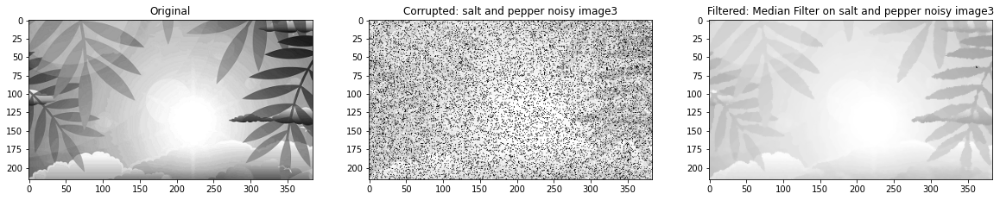

In [ ]:
#Median filter
img_medFilter3 = cv2.medianBlur(sp_noise_img3,5)
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_03,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(sp_noise_img3,cmap=plt.cm.gray)
plt.title("Corrupted: salt and pepper noisy image3")
fig.add_subplot(1, 3, 3)
plt.imshow(img_medFilter3,cmap=plt.cm.gray)
plt.title("Filtered: Median Filter on salt and pepper noisy image3")


Display mesh plots for different i) Gaussian filters, ii) First Order Derivative of Gaussian, iii)
Laplacian of Gaussian; using different sigma values


In [ ]:

n=50
x, y = np.mgrid[0:img_04.shape[0], 0:img_04.shape[1]]
gaussianFilter = gaussian(x - n, y - n, sigma=10)
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(x, y, gaussianFilter, rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=0)
plt.title("Gaussian with sigma value 10 on image 4")
plt.show()



In [76]:
gaussianFilter = gaussian(x - n, y - n, sigma=3)
#img_gaussianFilter = cv2.GaussianBlur(img_04, (5,5),sigmaX=3)
fig = plt.figure()
ax3 = fig.gca(projection='3d')
ax3.plot_surface(x, y, gaussianFilter,rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=0)
plt.title("Gaussian with sigma value 3 of image 4")
plt.show()


NameError: ignored

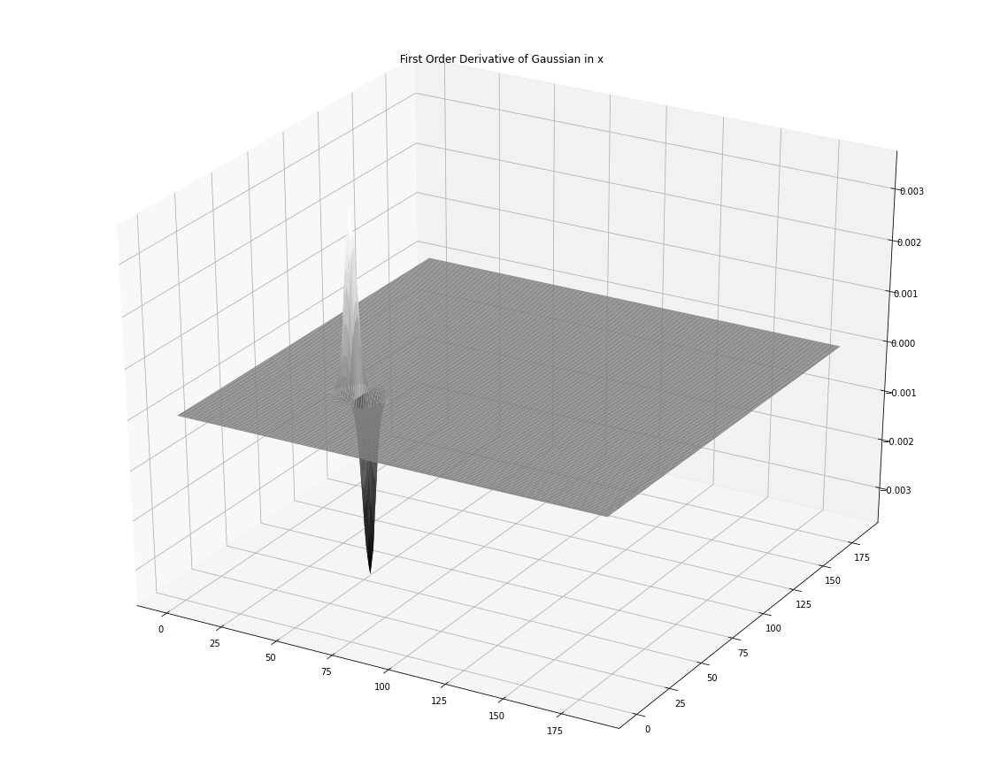

In [62]:
z3x = first_dev_gaussian_x(x - n, y - n, sigma=3)
fig = plt.figure()
ax3 = fig.gca(projection='3d')
ax3.plot_surface(x, y, z3x,rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=0)
# show it
plt.title(" First Order Derivative of Gaussian in x of image 4")
plt.show()


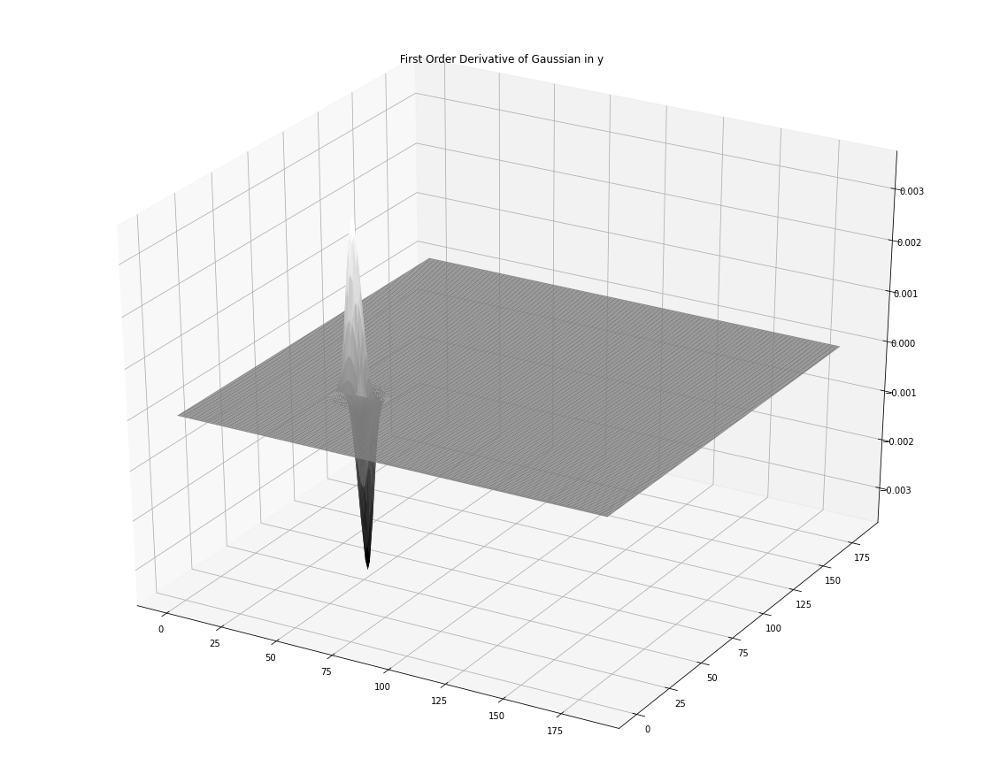

In [63]:
z3y = first_dev_guassian_y(x - n, y - n, sigma=3)
fig = plt.figure()
ax3 = fig.gca(projection='3d')
ax3.plot_surface(x, y, z3y,rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=0)
plt.title(" First Order Derivative of Gaussian in y of image 4")
plt.show()

In [ ]:
img_Laplacian4 = cv2.Laplacian(img_04,cv2.CV_64F)

z3y = img_Laplacian4(x - n, y - n, sigma=3)
fig = plt.figure()
ax3 = fig.gca(projection='3d')
ax3.plot_surface(x, y, z3y,rstride=1, cstride=1, cmap=plt.cm.gray,linewidth=0)
plt.title(" Laplacian of Gaussian of image 4")
plt.show()

Load a few images from the given set.
1 Apply Sobel operator, computer gradient magnitude and display the results (original image, gradient images and gradient magnitude image).

Text(0.5, 1.0, 'Gradient Magnitude of image07')

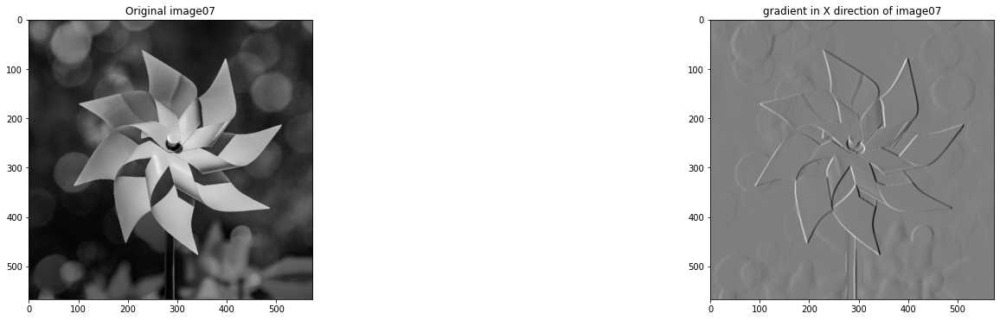

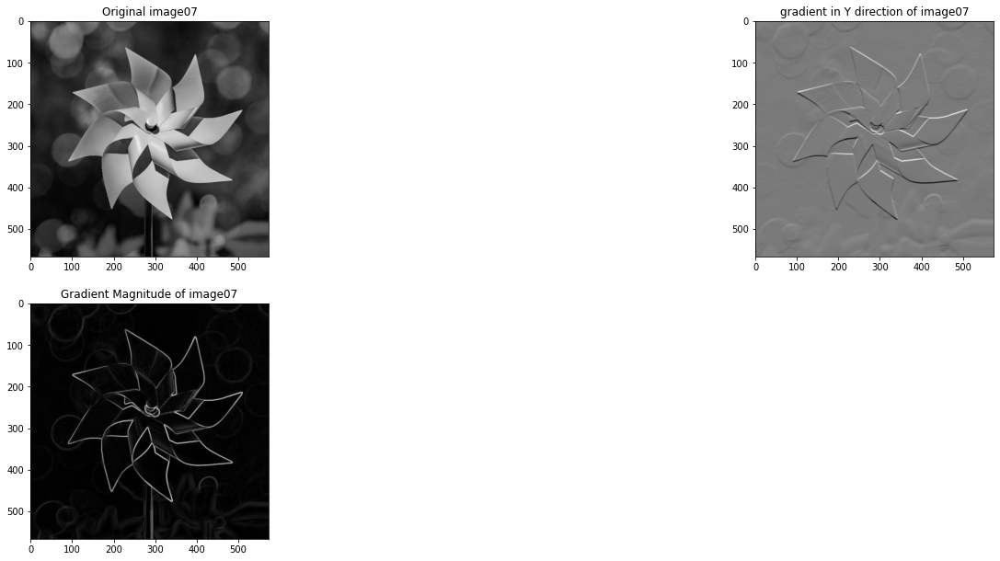

In [70]:
#Sobel X part
img_SobelX7 =  cv2.Sobel(img_07,cv2.CV_64F,1,0,ksize=5)
plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(2, 3, 1)
plt.imshow(img_07,cmap=plt.cm.gray)
plt.title("Original image07")
fig.add_subplot(2, 3, 3)
plt.imshow(img_SobelX7,cmap=plt.cm.gray)
plt.title("gradient in X direction of image07")

#Sobel Y part
img_SobelY7 = cv2.Sobel(img_07,cv2.CV_64F,0,1,ksize=5)
plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(3, 3, 1)
plt.imshow(img_07,cmap=plt.cm.gray)
plt.title("Original image07")
fig.add_subplot(3, 3, 3)
plt.imshow(img_SobelY7,cmap=plt.cm.gray)
plt.title("gradient in Y direction of image07")



gradient_magnitude = np.sqrt((np.power(img_SobelX7,2)+np.power(img_SobelY7,2)))
fig.add_subplot(3,3,4)
plt.imshow(gradient_magnitude,cmap=plt.cm.gray)
plt.title("Gradient Magnitude of image07")

Text(0.5, 1.0, 'Gradient Magnitude of image04')

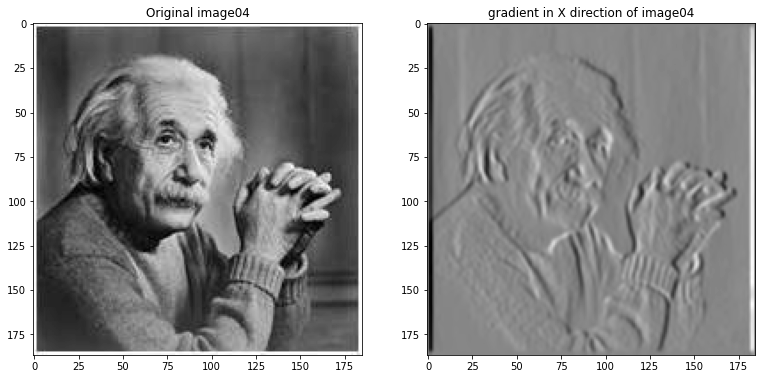

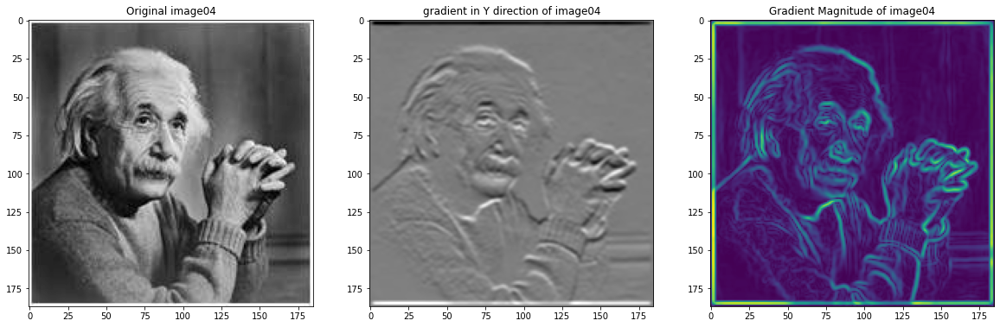

In [65]:
#img_05, img_08
#Sobel X part
img_SobelX4 =  cv2.Sobel(img_04,cv2.CV_64F,1,0,ksize=5)
plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_04,cmap=plt.cm.gray)
plt.title("Original image04")
fig.add_subplot(1, 3, 2)
plt.imshow(img_SobelX4,cmap=plt.cm.gray)
plt.title("gradient in X direction of image04")

#Sobel Y part
img_SobelY4 = cv2.Sobel(img_04,cv2.CV_64F,0,1,ksize=5)
plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(2, 3, 1)
plt.imshow(img_04,cmap=plt.cm.gray)
plt.title("Original image04")
fig.add_subplot(2, 3, 2)
plt.imshow(img_SobelY4,cmap=plt.cm.gray)
plt.title("gradient in Y direction of image04")



gradient_magnitude4 = np.sqrt((np.power(img_SobelX4,2)+np.power(img_SobelY4,2)))
fig.add_subplot(2,3,3)
plt.imshow(gradient_magnitude4)
plt.title("Gradient Magnitude of image04")

Apply Laplacian of Gaussian, computer laplacian magnitude and display the results (original image, filtered images and laplacian magnitude image). Try different filter kernel coefficients.

Text(0.5, 1.0, 'Laplacian of image 7')

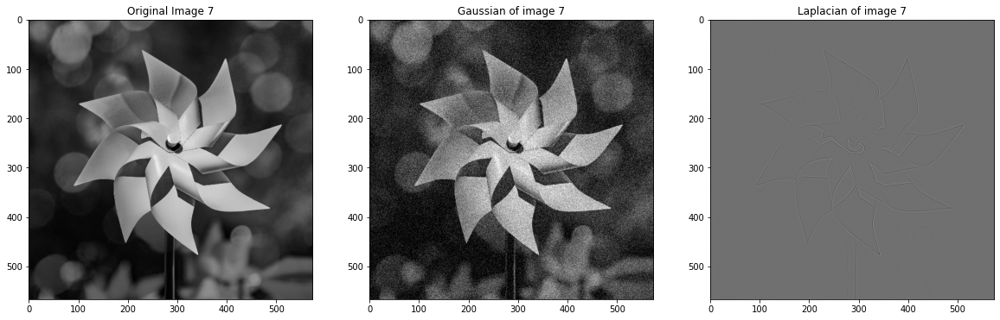

In [66]:
img_Laplacian7 = cv2.Laplacian(img_07,cv2.CV_64F)
plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_07,cmap=plt.cm.gray)
plt.title("Original Image 7")
fig.add_subplot(1, 3, 2).imshow(g_noise_img7,cmap=plt.cm.gray)
plt.title("Gaussian of image 7")
fig.add_subplot(1, 3, 3).imshow(img_Laplacian7,cmap=plt.cm.gray)
plt.title("Laplacian of image 7")


Text(0.5, 1.0, 'Laplacian of image 6')

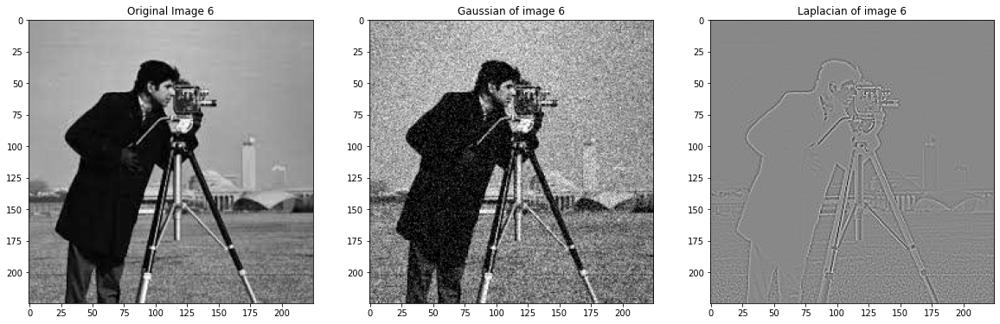

In [71]:
img_Laplacian6 = cv2.Laplacian(img_06,cv2.CV_64F)
plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_06,cmap=plt.cm.gray)
plt.title("Original Image 6")
fig.add_subplot(1, 3, 2).imshow(g_noise_img6,cmap=plt.cm.gray)
plt.title("Gaussian of image 6")
fig.add_subplot(1, 3, 3).imshow(img_Laplacian6,cmap=plt.cm.gray)
plt.title("Laplacian of image 6")


Text(0.5, 1.0, 'Laplacian of image 6 using kernel size=3')

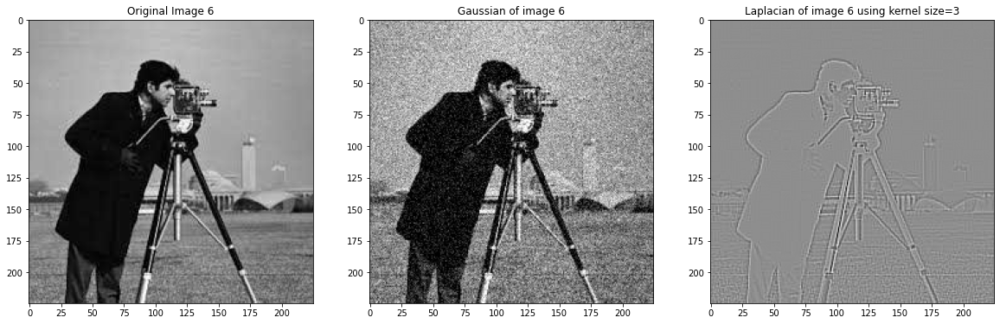

In [72]:
img_Laplacian6 = cv2.Laplacian(img_06,cv2.CV_64F,ksize=3)
plt.rcParams['figure.figsize'] = (20.0, 16.0) # set default size of plots
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_06,cmap=plt.cm.gray)
plt.title("Original Image 6")
fig.add_subplot(1, 3, 2).imshow(g_noise_img6,cmap=plt.cm.gray)
plt.title("Gaussian of image 6")
fig.add_subplot(1, 3, 3).imshow(img_Laplacian6,cmap=plt.cm.gray)
plt.title("Laplacian of image 6 using kernel size=3")


Apply Canny Edge Detector and display the results

Text(0.5, 1.0, 'Canny Edge')

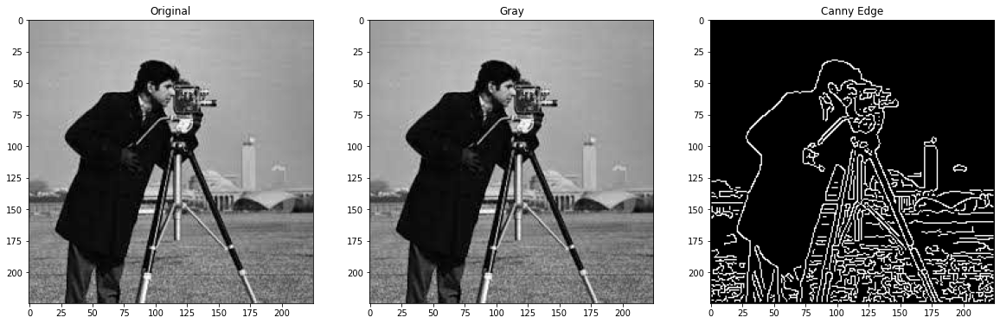

In [73]:
img_canny6 = feature.canny(color.rgb2gray(img_06))
fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(img_06,cmap=plt.cm.gray)
plt.title("Original")
fig.add_subplot(1, 3, 2)
plt.imshow(color.rgb2gray(img_06),cmap=plt.cm.gray)
plt.title("Gray")
fig.add_subplot(1, 3, 3)
plt.imshow(img_canny6,cmap=plt.cm.gray)
plt.title("Canny Edge")